In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

import graphviz
from networkx.drawing.nx_agraph import graphviz_layout
from functools import reduce

import networkx as nx
import operator

from matplotlib.lines import Line2D
from sklearn.preprocessing import MinMaxScaler
from networkx.algorithms import tree

pd.set_option('display.max_rows', 300) # specifies number of rows to show
#pd.options.display.float_format = '{:40,.4f}'.format # specifies default number format to 4 decimal places
plt.style.use('ggplot') # specifies that graphs should use ggplot styling
%matplotlib inline

In [3]:
# Save data for a specific quarter to a CSV file
key =  "Q2"

# Read data from the CSV file
selected_quarter = pd.read_csv('Quarters_Adj_Matrices/'+ key +'_logret.csv', index_col=0)
selected_quarter.head()


,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACGL,ACN,ADBE,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
A,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAL,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAPL,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABBV,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
# Create edge-list (only keep values in the upper triangle)
links = selected_quarter.where(np.triu(np.ones(selected_quarter.shape)).astype(bool))
links = links.stack().reset_index()
links.columns = ['stock1', 'stock2','value']
links['value'] = links['value'].astype(int)
links.head(10)

,stock1,stock2,value
0,A,A,0
1,A,AAL,0
2,A,AAP,0
3,A,AAPL,0
4,A,ABBV,0
5,A,ABC,0
6,A,ABT,1
7,A,ACGL,0
8,A,ACN,0
9,A,ADBE,0


In [5]:
# Only keep stocks with edges=1
links_filtered = links.loc[(links['value'] == 1)]
conn_nodes = links_filtered.groupby('stock1').count()
print('Number of connected nodes:', len(conn_nodes), 
      '\nNumber of edges:', links_filtered['value'].count())
links_filtered.head(10)

Number of connected nodes: 306 
Number of edges: 2042


,stock1,stock2,value
6,A,ABT,1
112,A,CRL,1
133,A,DHR,1
367,A,PKI,1
436,A,TMO,1
623,AAL,DAL,1
778,AAL,LUV,1
948,AAL,UAL,1
1044,AAP,AZO,1
1231,AAP,INTU,1


/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/224687225.py:12: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  pos = graphviz_layout(G)


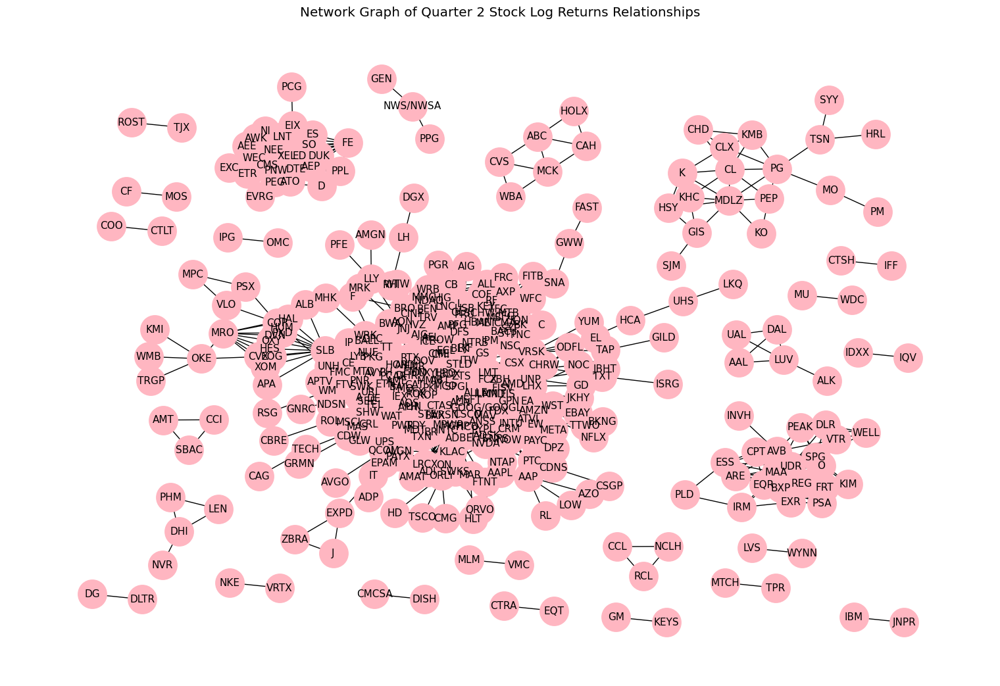

In [6]:
#import pygraphviz
import pydot
from networkx.drawing.nx_pydot import graphviz_layout

# Draw network graph
G = nx.from_pandas_edgelist(links_filtered, 'stock1', 'stock2')

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 15
fig_size[1] = 10

pos = graphviz_layout(G)
nx.draw(G, pos=pos, with_labels=True, node_color='lightpink', node_size=800, edge_color='black', linewidths=4, font_size=11)

# Add title and labels
plt.title("Network Graph of Quarter 2 Stock Log Returns Relationships")


plt.savefig("Images/graph.png")
plt.show()


Number of components: 26


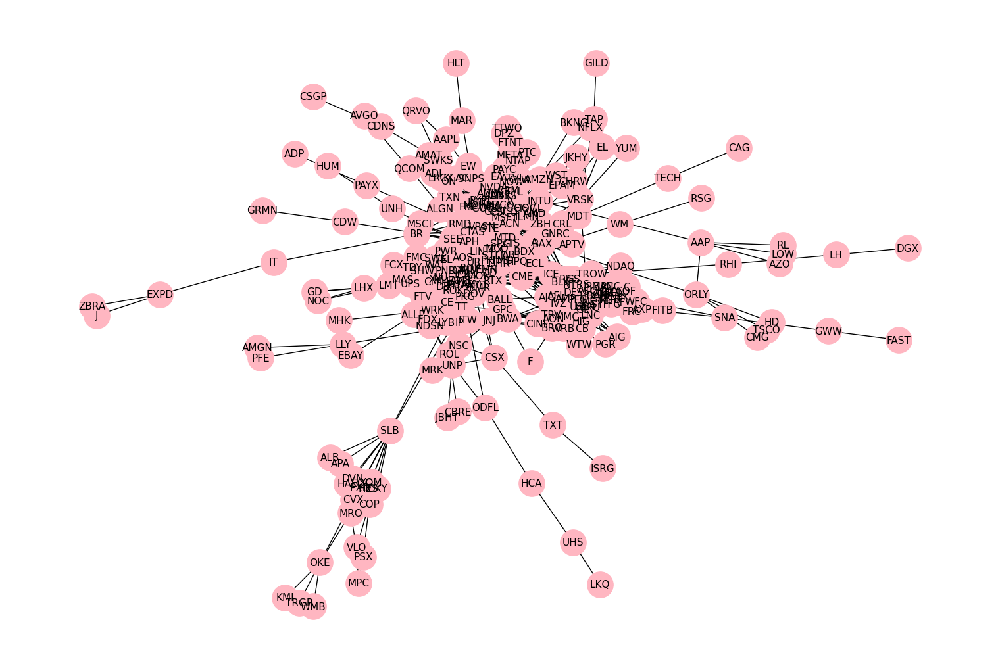

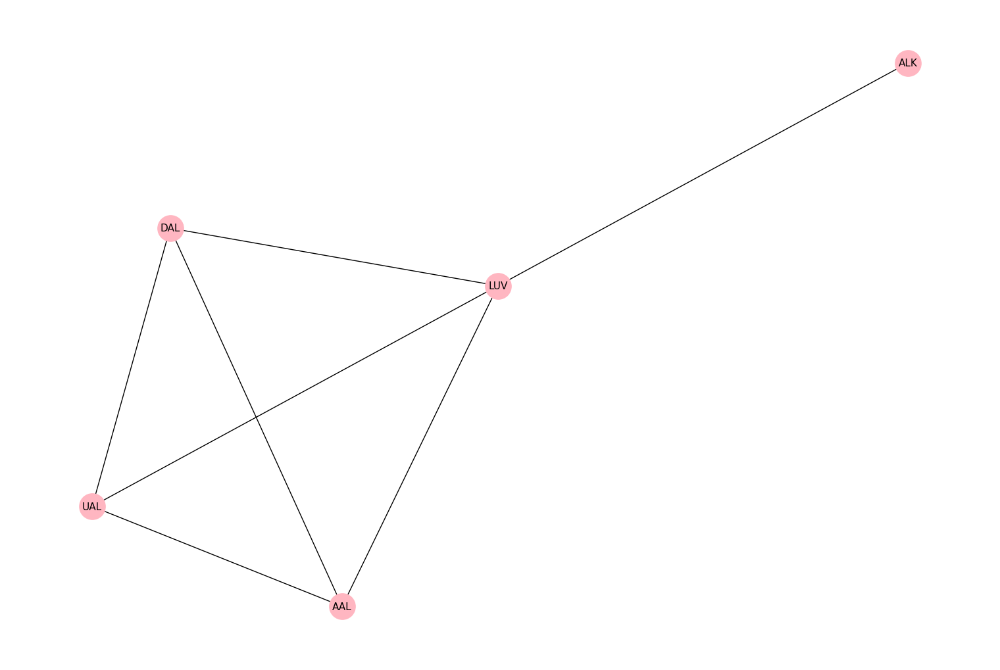

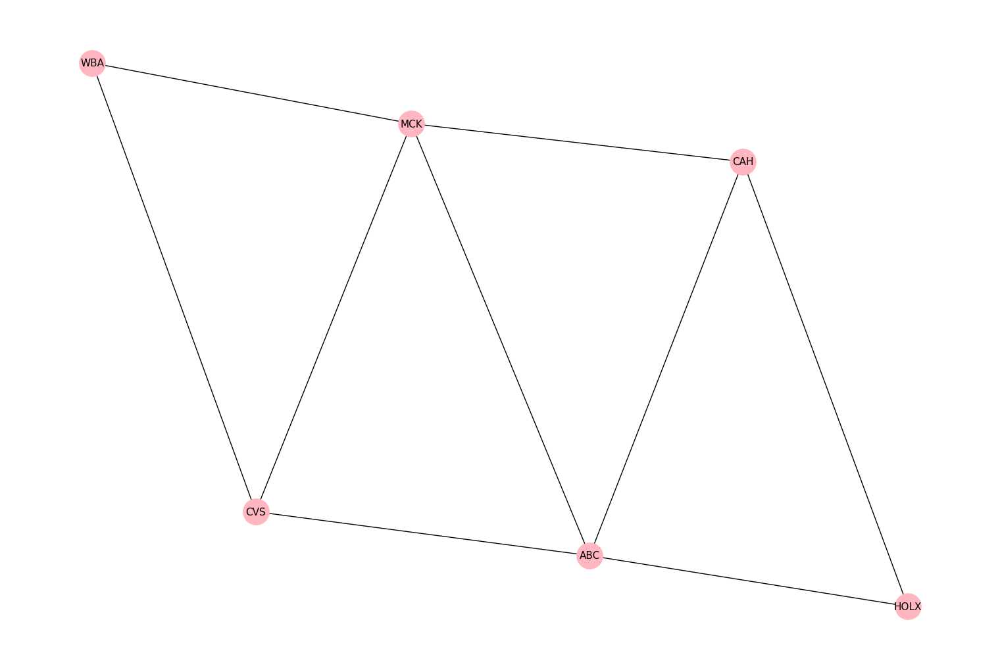

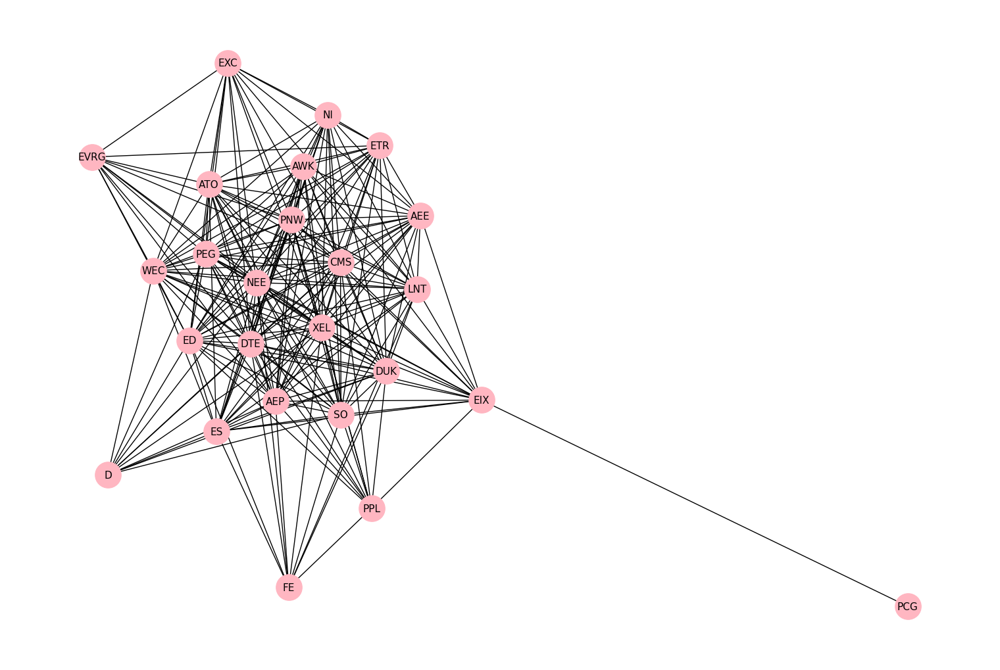

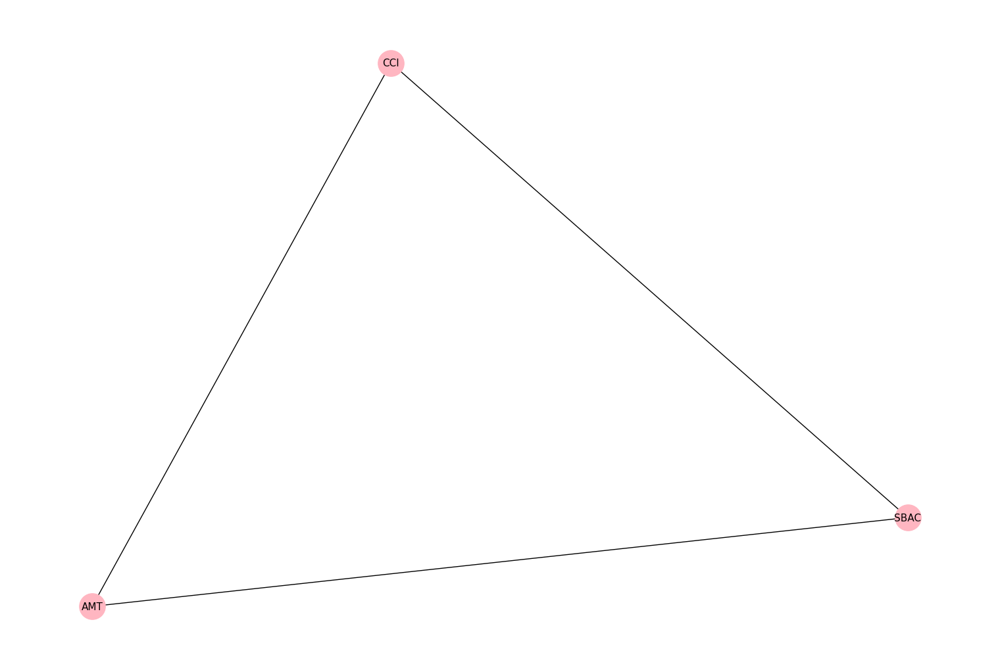

...

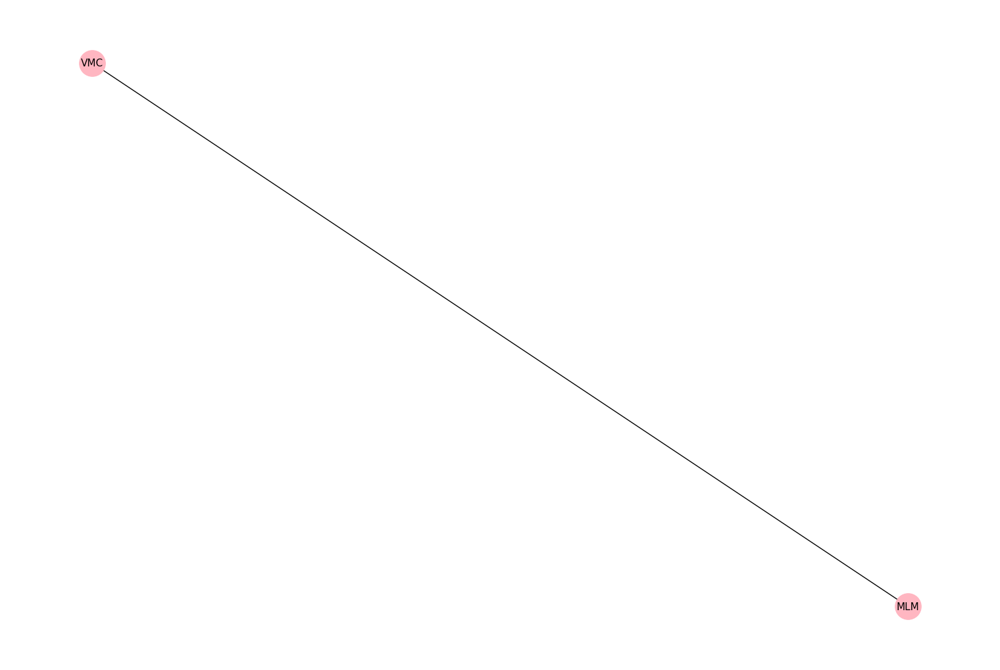

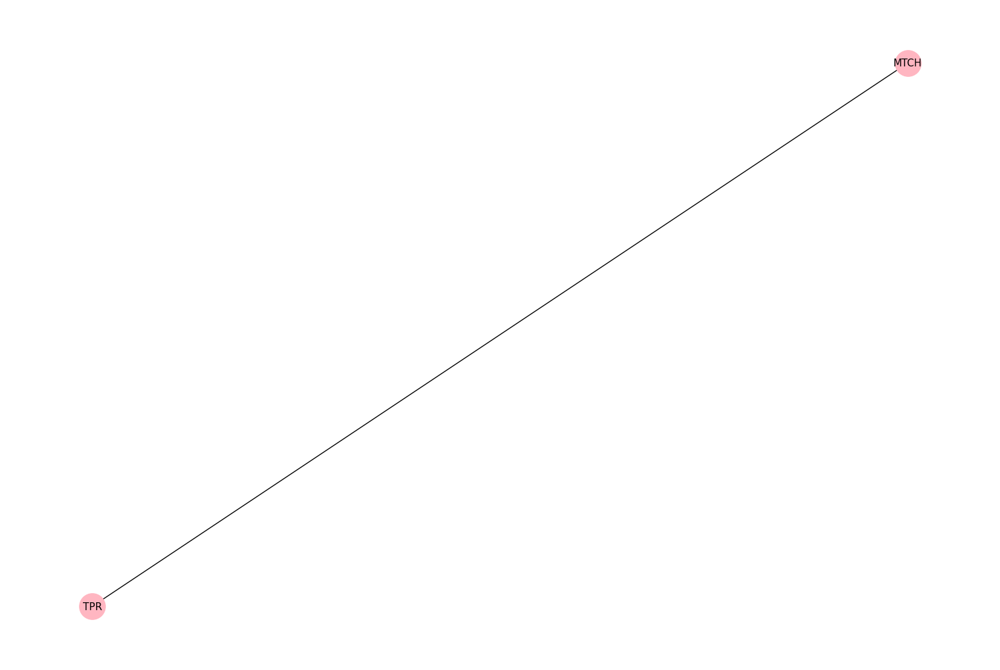

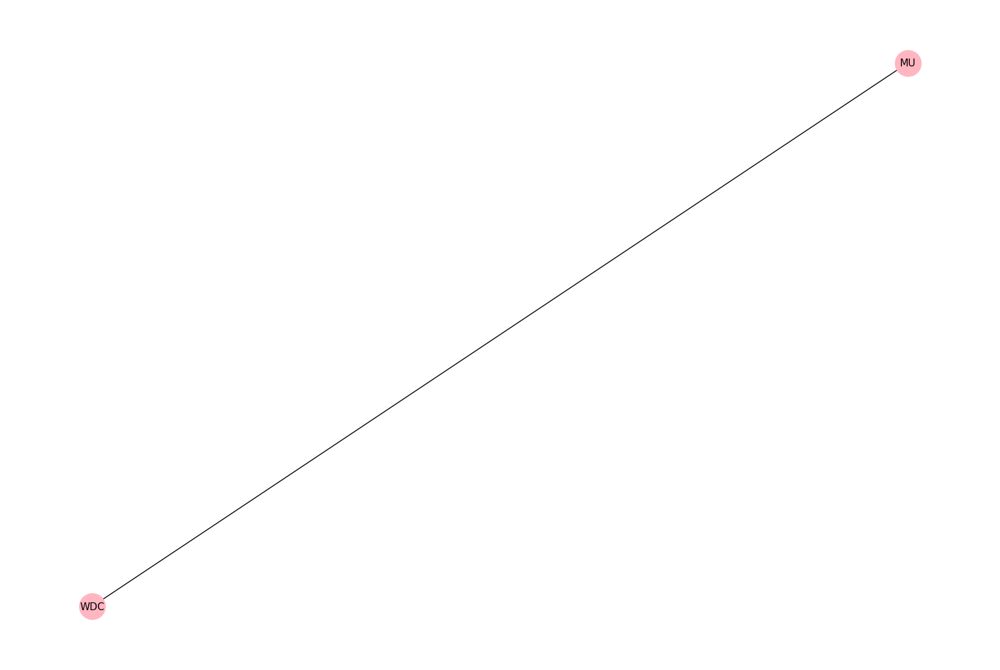

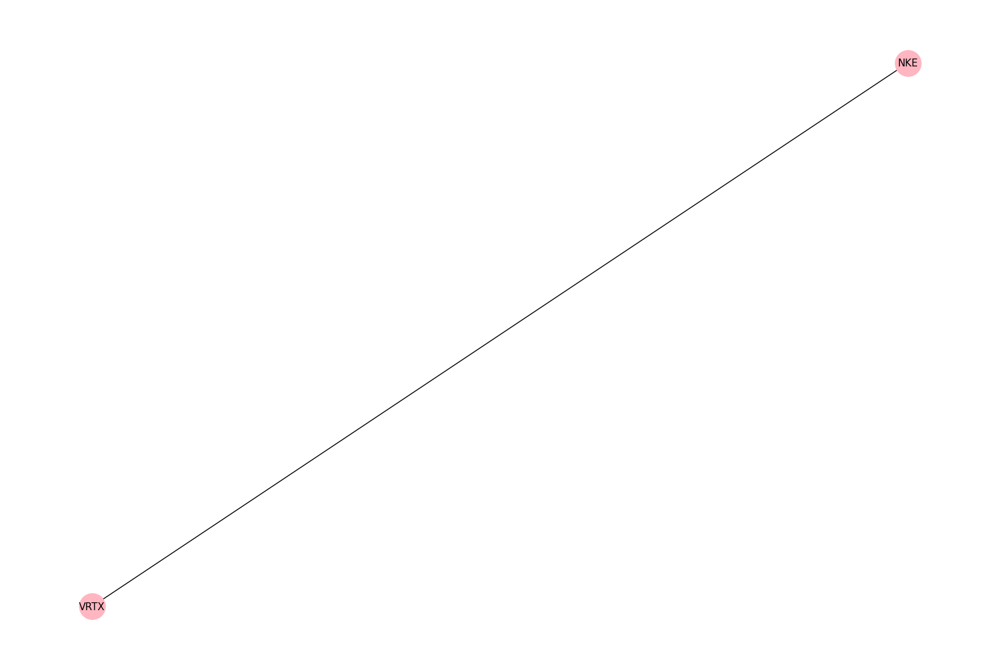

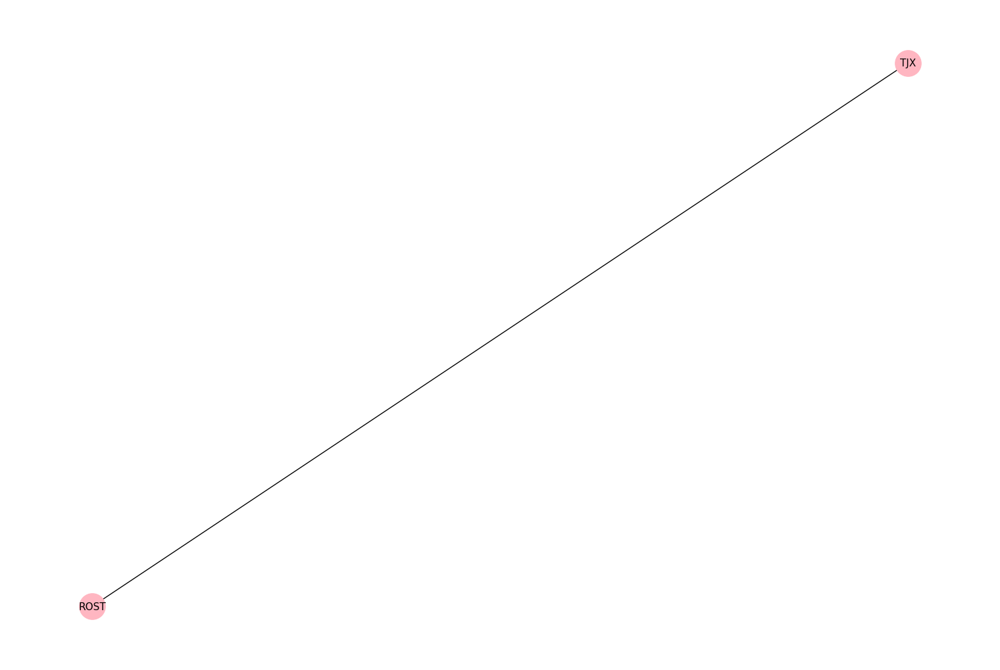

In [7]:
# Show the subgraphs (disconnected components) of the network
connected_components = list(nx.connected_components(G))
print('Number of components:', len(connected_components))

subgraphs = [G.subgraph(c).copy() for c in connected_components]

for sub_graph in subgraphs:
    nx.draw(sub_graph, with_labels=True,node_color ="lightpink", node_size=800, edge_color='black',linewidths=1,font_size=11)
    plt.show()


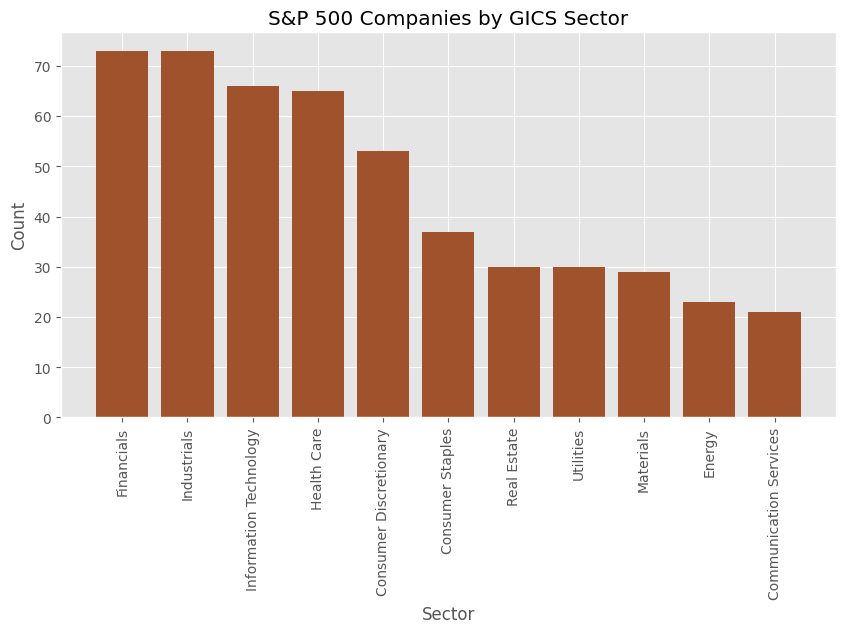

500


,Count
Industry,
Financials,73
Industrials,73
Information Technology,66
Health Care,65
Consumer Discretionary,53
Consumer Staples,37
Real Estate,30
Utilities,30
Materials,29


In [9]:
# Create bar chart aggregating companies by industry
companies = pd.read_csv('company_sectors_copy.csv')

companies.rename(columns = {'Symbol': 'Company'}, inplace=True)
companies.rename(columns = {'GICS Sector': 'Industry'}, inplace=True)

first_words = companies.apply(lambda x: x.str.split().str[0])
companies.Company = first_words.Company

companies.Company.replace('BF/B', 'BFB', inplace=True)
companies.Company.replace('BRK/B', 'BRKB', inplace=True)

dual_shares_1 = ['FOX', 'GOOG', 'NWS']
dual_shares_2 = ['FOXA', 'GOOGL', 'NWSA']

for name in companies['Company']:
    for i in range(len(dual_shares_1)):
        if name == dual_shares_1[i]:
            new_name = dual_shares_1[i] + '/' + dual_shares_2[i]
            df_industry = pd.DataFrame(companies['Industry'].loc[companies['Company']==name], columns=['Industry'])
            industry = list(df_industry['Industry'])
            df_new_name = pd.DataFrame([[new_name, industry[0]]], columns=['Company', 'Industry'])
            companies = pd.concat([companies, df_new_name])
            companies = companies.loc[companies['Company']!=dual_shares_1[i]]
            companies = companies.loc[companies['Company']!=dual_shares_2[i]]

companies.sort_values('Company', inplace=True)

industries = companies.groupby('Industry').count().sort_values('Company', ascending=False)
industries.rename(columns={'Company': 'Count'}, inplace=True)
companies.set_index('Company', inplace=True)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 5

plt.bar(industries.index, industries.Count, color='sienna')
plt.xlabel('Sector')
plt.ylabel('Count')
plt.title('S&P 500 Companies by GICS Sector')
plt.xticks(rotation=90)
plt.show()

print(industries['Count'].sum())
industries

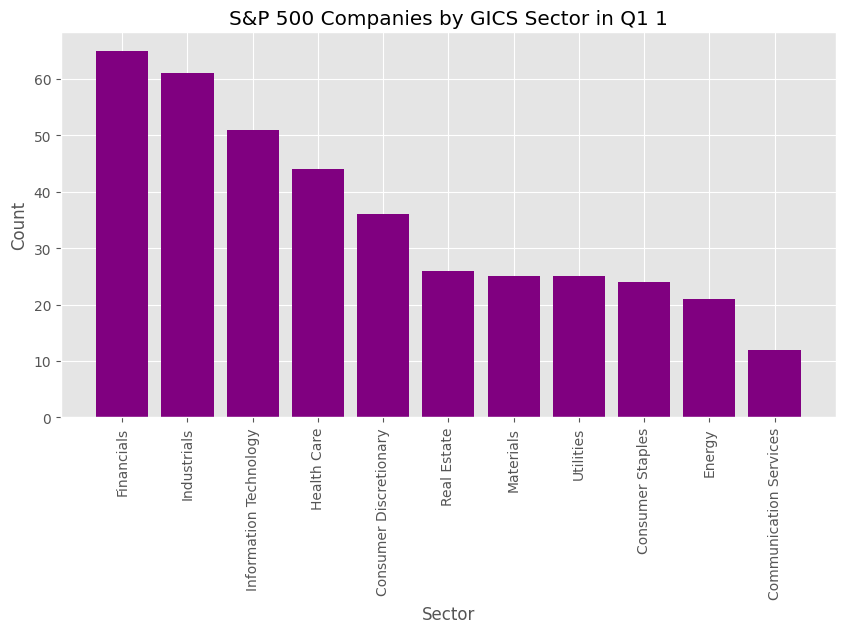

390

In [10]:
# Allocate the corresponding industry to each company in the network for a particular year
comp_dict = companies.to_dict()

node_dict = {}
for node in G.nodes:
    node_dict[node] = comp_dict['Industry'][node]

node_ind = pd.DataFrame.from_dict(node_dict, orient='index')
node_ind.rename(columns={0: 'Sector'}, inplace=True)
node_ind.index.names = ['Company']
ind_freq = pd.DataFrame(node_ind.groupby('Sector').size(), columns=['Count'])
ind_freq.sort_values('Count', ascending=False, inplace=True)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 5

plt.bar(ind_freq.index, ind_freq['Count'], color='purple')
plt.xlabel('Sector')
plt.ylabel('Count')
plt.title('S&P 500 Companies by GICS Sector in Q1 1')
plt.xticks(rotation=90)
plt.show()

ind_freq['Count'].sum()

In [11]:
# Number of connected nodes, number of edges
nodes = G.nodes
edges = G.edges
print(len(nodes), len(edges))

390 2042


/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/2279203296.py:21: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color=[color_map[comp_dict['Industry'][node]] for node in G.nodes],


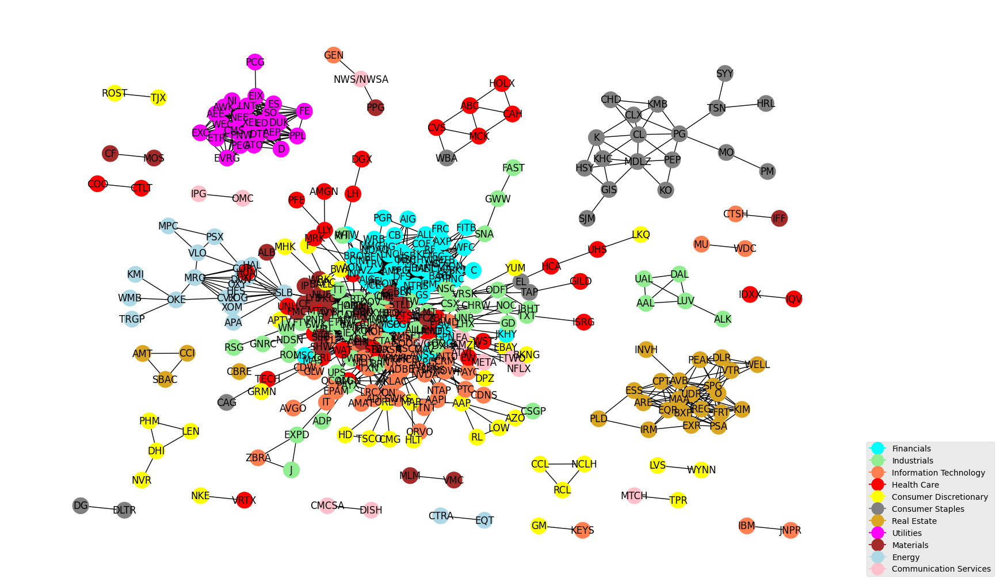

In [12]:
# Allocate a different color to each industry
color_map = {}
colors = ['cyan', 'lightgreen', 'coral', 'red', 'yellow', 'gray', 'goldenrod', 'magenta', 'brown', 'lightblue', 'pink']

for i, index in enumerate(industries.index):
    color_map[index] = colors[i]

G = nx.from_pandas_edgelist(links_filtered, 'stock1', 'stock2')

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 15
fig_size[1] = 10

# Plot network graph with legend using different colors for nodes depending on industry
from matplotlib.lines import Line2D

legend_circles = []
for i, color in enumerate(colors):
    legend_circles.append(Line2D([0], [0], marker='o', color=color, label=industries.index[i], markerfacecolor=color, markersize=15))

nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color=[color_map[comp_dict['Industry'][node]] for node in G.nodes], 
        node_size=400, edge_color='black', linewidths=1, font_size=12)
plt.legend(handles=legend_circles, loc='lower right', bbox_to_anchor=(1.15,0))
plt.savefig("network.png", bbox_inches='tight')
plt.show()

Number of components: 26


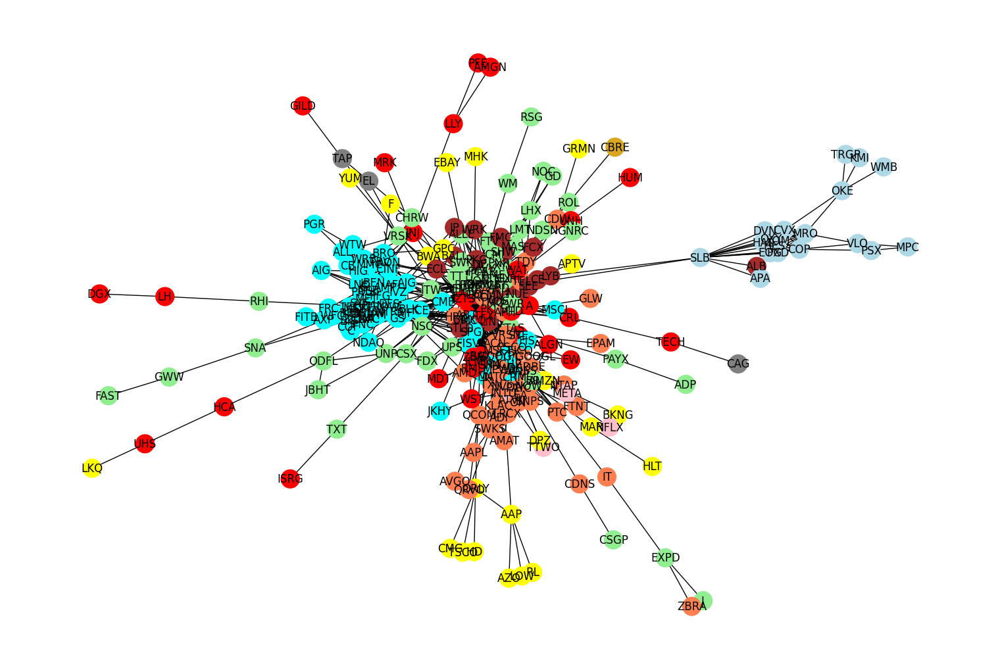

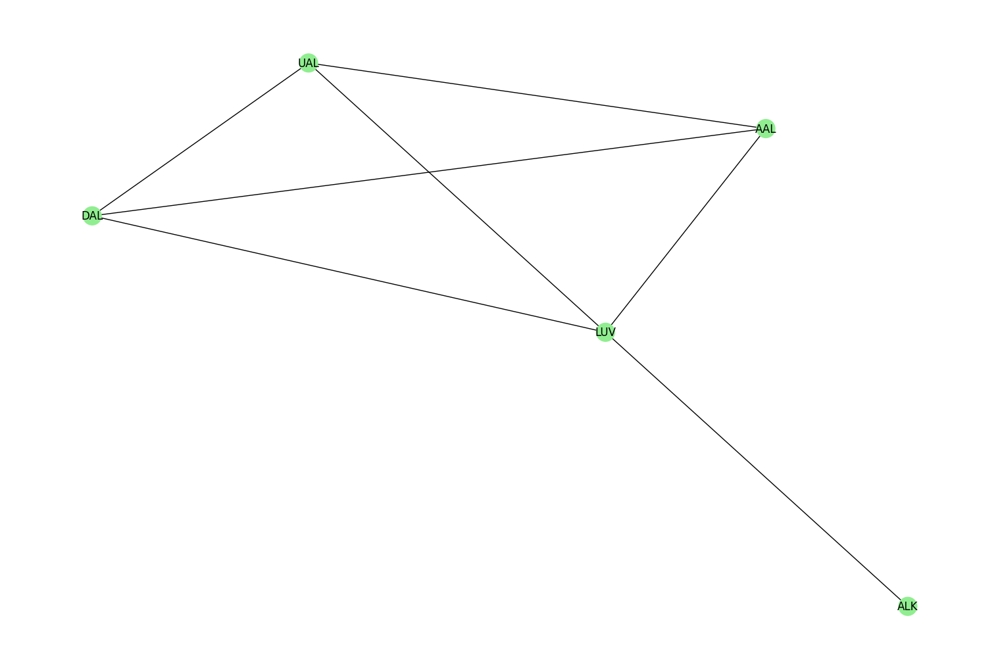

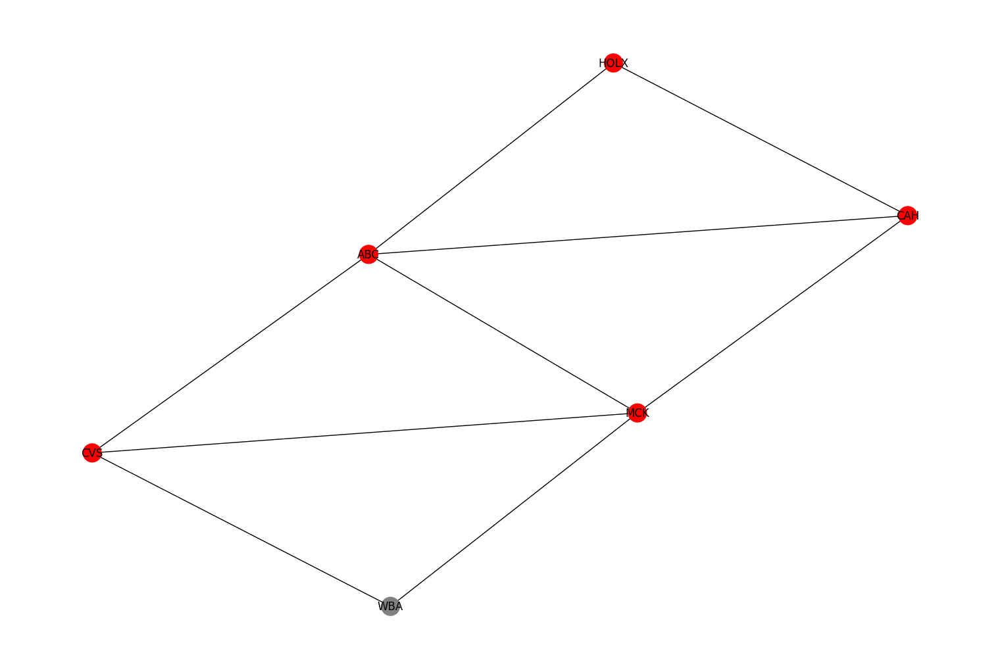

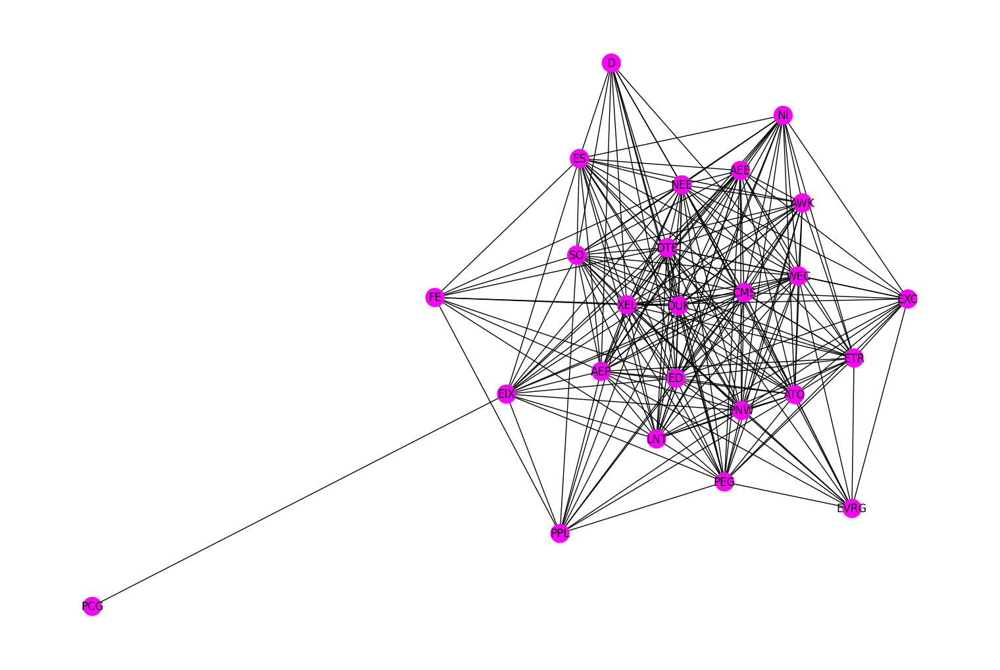

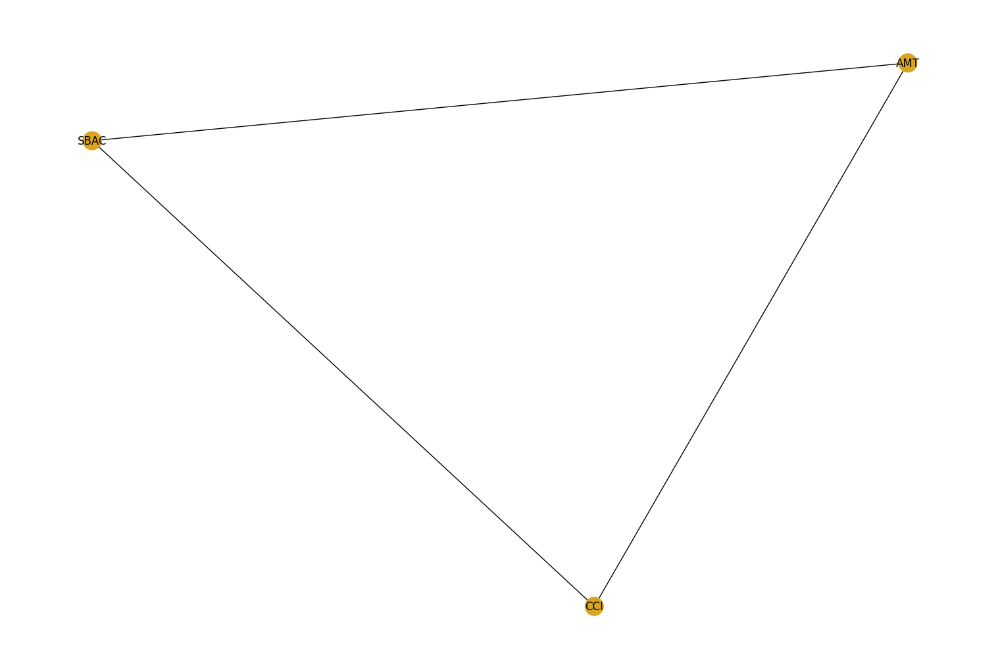

...

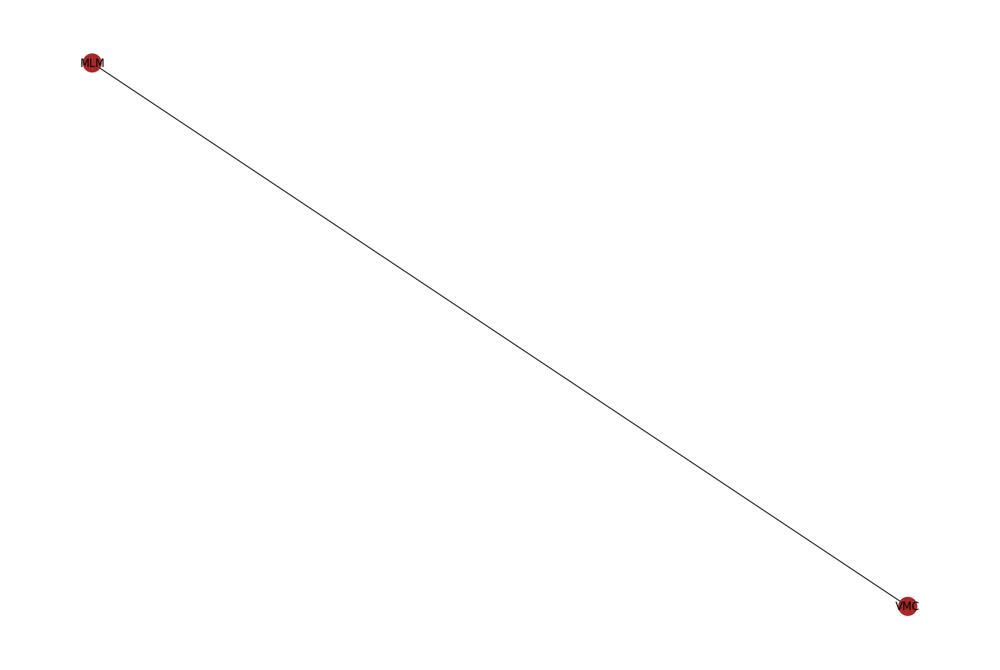

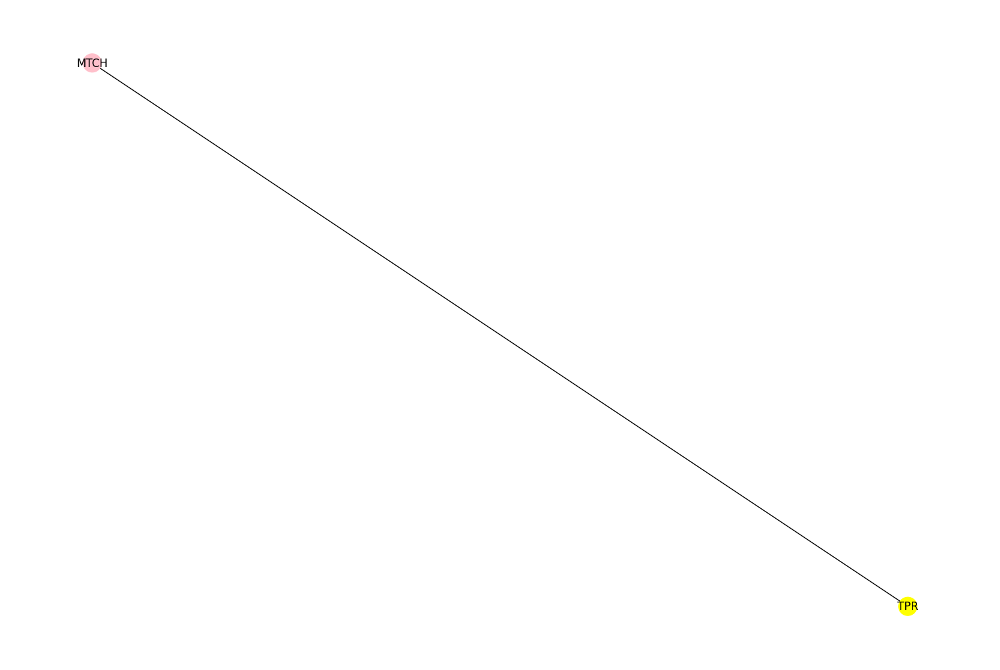

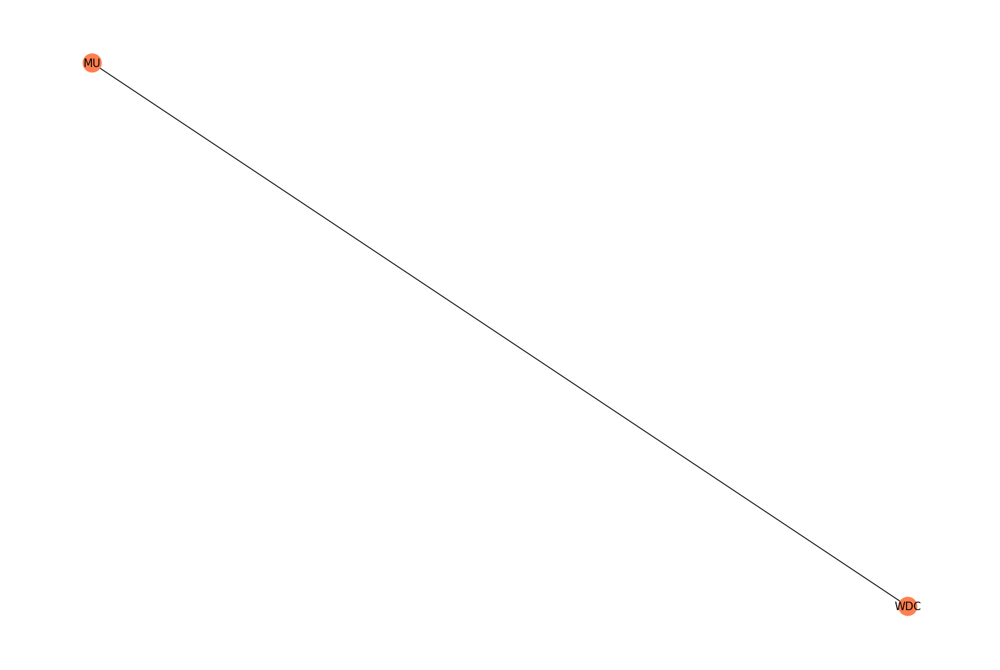

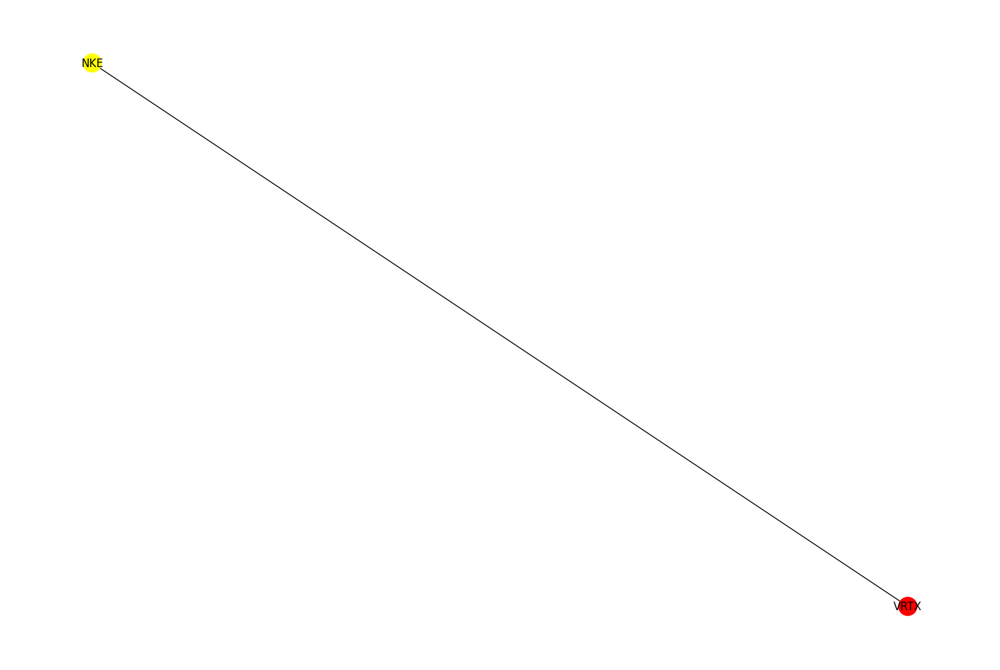

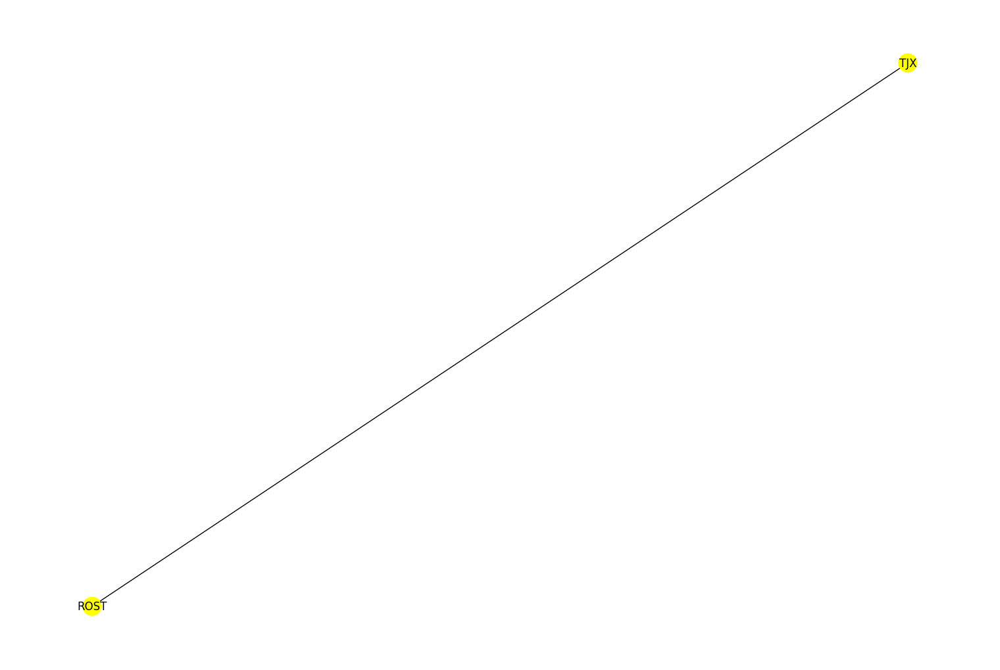

In [14]:
# Show the subgraphs (disconnected components) of the network by industry
subgraphs = [G.subgraph(c).copy() for c in nx.connected_components(G)]
print('Number of components:', len(subgraphs))

for sub_graph in subgraphs:
    nx.draw(sub_graph, pos=nx.spring_layout(sub_graph), with_labels=True, node_color=[color_map[comp_dict['Industry'][node]] for node in sub_graph.nodes], node_size=400, edge_color='black', linewidths=1, font_size=12)
    plt.show()


In [15]:
# Network measures of each network subgraph
for i, sub_graph in enumerate(subgraphs):
    print('Subgraph ' + str(i+1))
    print('Number of nodes:', len(sub_graph.nodes), '\nNumber of edges:', len(sub_graph.edges), '\nClustering coefficient:', nx.average_clustering(sub_graph), '\nDiameter:', nx.diameter(sub_graph), 
          '\nRadius:', nx.radius(sub_graph), '\nCentral nodes:', nx.center(sub_graph), 
          '\nPeripheral nodes:', nx.periphery(sub_graph), '\n')

Subgraph 1
Number of nodes: 269 
Number of edges: 1636 
Clustering coefficient: 0.480309690651029 
Diameter: 10 
Radius: 6 
Central nodes: ['ABT', 'DHR', 'PKI', 'AOS', 'APD', 'APH', 'BA', 'CAT', 'CTAS', 'DD', 'DOV', 'EMR', 'GOOG/GOOGL', 'HPQ', 'IEX', 'MCO', 'RTX', 'SPGI', 'ZTS', 'MCHP', 'VRSN', 'GL', 'TRV', 'L', 'MMC', 'URI', 'ITW', 'PCAR', 'PH', 'ROK', 'AME', 'AVY', 'CME', 'DE', 'EMN', 'ETN', 'HON', 'LYB', 'MMM', 'PNR', 'ROP', 'TEL', 'WRK', 'XYL', 'IVZ', 'USB', 'CMI', 'ECL', 'PKG', 'TT', 'WAT', 'CINF', 'FDX'] 
Peripheral nodes: ['DGX', 'J', 'ZBRA', 'FAST', 'KMI', 'LKQ', 'MPC', 'TRGP', 'WMB'] 

Subgraph 2
Number of nodes: 5 
Number of edges: 7 
Clustering coefficient: 0.7 
Diameter: 2 
Radius: 1 
Central nodes: ['LUV'] 
Peripheral nodes: ['UAL', 'DAL', 'ALK', 'AAL'] 

Subgraph 3
Number of nodes: 6 
Number of edges: 9 
Clustering coefficient: 0.7222222222222222 
Diameter: 3 
Radius: 2 
Central nodes: ['MCK', 'ABC', 'CVS', 'CAH'] 
Peripheral nodes: ['WBA', 'HOLX'] 

Subgraph 4
Number of 

Network Measures

In [17]:
# Degree centrality of nodes
deg_c = nx.degree_centrality(G)
deg_c_sorted = sorted(deg_c.items(), key=operator.itemgetter(1), reverse=True)

deg_df = pd.DataFrame(deg_c_sorted, columns=['company', 'value'])
deg_df.set_index('company', inplace=True)
deg_df

,value
company,
MCO,0.131105
APD,0.128535
DD,0.120823
RJF,0.110540
GL,0.107969
...,...
WMB,0.002571
ROST,0.002571
TJX,0.002571


In [18]:
# Closeness centrality of nodes
close_c = nx.closeness_centrality(G)
close_c_sorted = sorted(close_c.items(), key=operator.itemgetter(1), reverse=True)

close_df = pd.DataFrame(close_c_sorted, columns=['company', 'value'])
close_df.set_index('company', inplace=True)
close_df

,value
company,
MCO,0.306198
APD,0.296845
ABT,0.295893
DD,0.288046
SPGI,0.285817
...,...
WDC,0.002571
NKE,0.002571
VRTX,0.002571


In [19]:
# Betweenness centrality of nodes
betw_c = nx.betweenness_centrality(G)
betw_c_sorted = sorted(betw_c.items(), key=operator.itemgetter(1), reverse=True)

betw_df = pd.DataFrame(betw_c_sorted, columns=['company', 'value'])
betw_df.set_index('company', inplace=True)
betw_df

,value
company,
APD,0.082287
SLB,0.063174
MCO,0.049590
RJF,0.037682
DHR,0.034131
...,...
WMB,0.000000
ROST,0.000000
TJX,0.000000


In [20]:
# Eigenvector centrality of nodes
eig_c = nx.eigenvector_centrality(G)
eig_c_sorted = sorted(eig_c.items(), key=operator.itemgetter(1), reverse=True)

eig_df = pd.DataFrame(eig_c_sorted, columns=['company', 'value'])
eig_df.set_index('company', inplace=True)
eig_df

,value
company,
BLK,1.960912e-01
RJF,1.931405e-01
NTRS,1.908407e-01
PFG,1.814405e-01
HBAN,1.720302e-01
...,...
WDC,2.198534e-86
NKE,2.198534e-86
VRTX,2.198534e-86


In [21]:
# Clustering coefficients of nodes
clust = nx.clustering(G)
clust_sorted = sorted(clust.items(), key=operator.itemgetter(1), reverse=True)

clust_df = pd.DataFrame(clust_sorted, columns=['company', 'value'])
clust_df.set_index('company', inplace=True)
clust_df

,value
company,
AAL,1.0
DAL,1.0
UAL,1.0
LOW,1.0
RL,1.0
...,...
WMB,0.0
ROST,0.0
TJX,0.0


In [22]:
# Average clustering coefficient, diameter, radius, central and peripheral nodes of network
if nx.is_connected(G) == True:
    print(nx.average_clustering(G), '\n', nx.diameter(G), '\n', nx.radius(G), '\n', nx.center(G), '\n', nx.periphery(G))
else:
    print(nx.average_clustering(G))

0.4848252119242591


In [23]:
# Eccentricity of nodes
if nx.is_connected(G) == True:
    ecc = nx.eccentricity(G)
    ecc_sorted = sorted(ecc.items(), key=operator.itemgetter(1), reverse=True)

    ecc_df = pd.DataFrame(ecc_sorted, columns=['company', 'value'])
    ecc_df.set_index('company', inplace=True)
    print(ecc_df)
else:
    print(nx.is_connected(G))

False


In [24]:
# Dominating set of network
nx.dominating_set(G)

{'A',
 'AAPL',
 'ADI',
 'ALB',
 'ALGN',
 'ALK',
 'AMAT',
 'AMD',
 'AMGN',
 'ANSS',
 'APA',
 'APTV',
 'ARE',
 'ATVI',
 'AVGO',
 'AXP',
 'AZO',
 'BALL',
 'BDX',
 'BKNG',
 'BLK',
 'BRO',
 'C',
 'CAG',
 'CAH',
 'CBRE',
 'CCL',
 'CHRW',
 'CINF',
 'CL',
 'CMCSA',
 'CMG',
 'CMI',
 'CMS',
 'COF',
 'CSCO',
 'CSGP',
 'CTLT',
 'DGX',
 'DLTR',
 'DPZ',
 'DVN',
 'EBAY',
 'ECL',
 'EOG',
 'EPAM',
 'EQT',
 'EW',
 'FAST',
 'FDX',
 'FE',
 'FITB',
 'FMC',
 'FRC',
 'FRT',
 'FTNT',
 'FTV',
 'GEN',
 'GILD',
 'GIS',
 'GLW',
 'GNRC',
 'GRMN',
 'HRL',
 'IBM',
 'IFF',
 'INVH',
 'IP',
 'IPG',
 'IQV',
 'IRM',
 'ISRG',
 'IT',
 'JBHT',
 'JNJ',
 'KEYS',
 'KMI',
 'KO',
 'LIN',
 'LNC',
 'LVS',
 'LYB',
 'MAR',
 'MDT',
 'META',
 'MHK',
 'MLM',
 'MOS',
 'MPC',
 'MSCI',
 'MTCH',
 'NDAQ',
 'NDSN',
 'NFLX',
 'NOC',
 'NSC',
 'NUE',
 'NVR',
 'PAYX',
 'PCG',
 'PEAK',
 'PFE',
 'PGR',
 'PH',
 'PHM',
 'PM',
 'PPG',
 'PWR',
 'PYPL',
 'RHI',
 'RL',
 'RMD',
 'RSG',
 'SBAC',
 'SEE',
 'SHW',
 'SWK',
 'SYY',
 'TDY',
 'TEL',
 'TJX',
 'TR

In [25]:
# Shortest paths from one node to another
nx.shortest_path(G)

{'A': {'A': ['A'],
  'ABT': ['A', 'ABT'],
  'CRL': ['A', 'CRL'],
  'DHR': ['A', 'DHR'],
  'PKI': ['A', 'PKI'],
  'TMO': ['A', 'TMO'],
  'ACN': ['A', 'ABT', 'ACN'],
  'AJG': ['A', 'ABT', 'AJG'],
  'AOS': ['A', 'ABT', 'AOS'],
  'APD': ['A', 'ABT', 'APD'],
  'APH': ['A', 'ABT', 'APH'],
  'BA': ['A', 'ABT', 'BA'],
  'BAX': ['A', 'ABT', 'BAX'],
  'BDX': ['A', 'ABT', 'BDX'],
  'BLK': ['A', 'ABT', 'BLK'],
  'CAT': ['A', 'ABT', 'CAT'],
  'CSCO': ['A', 'ABT', 'CSCO'],
  'CTAS': ['A', 'ABT', 'CTAS'],
  'DD': ['A', 'ABT', 'DD'],
  'DOV': ['A', 'ABT', 'DOV'],
  'EMR': ['A', 'ABT', 'EMR'],
  'FISV': ['A', 'ABT', 'FISV'],
  'GOOG/GOOGL': ['A', 'ABT', 'GOOG/GOOGL'],
  'GS': ['A', 'ABT', 'GS'],
  'HPQ': ['A', 'ABT', 'HPQ'],
  'IEX': ['A', 'ABT', 'IEX'],
  'INTC': ['A', 'ABT', 'INTC'],
  'JNJ': ['A', 'ABT', 'JNJ'],
  'LIN': ['A', 'ABT', 'LIN'],
  'MCO': ['A', 'ABT', 'MCO'],
  'MDT': ['A', 'ABT', 'MDT'],
  'MSFT': ['A', 'ABT', 'MSFT'],
  'MTD': ['A', 'ABT', 'MTD'],
  'NTRS': ['A', 'ABT', 'NTRS'],
  'RJF

In [26]:
nx.node_connectivity(G)

0

Construct Stock Network Graphs

10


/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


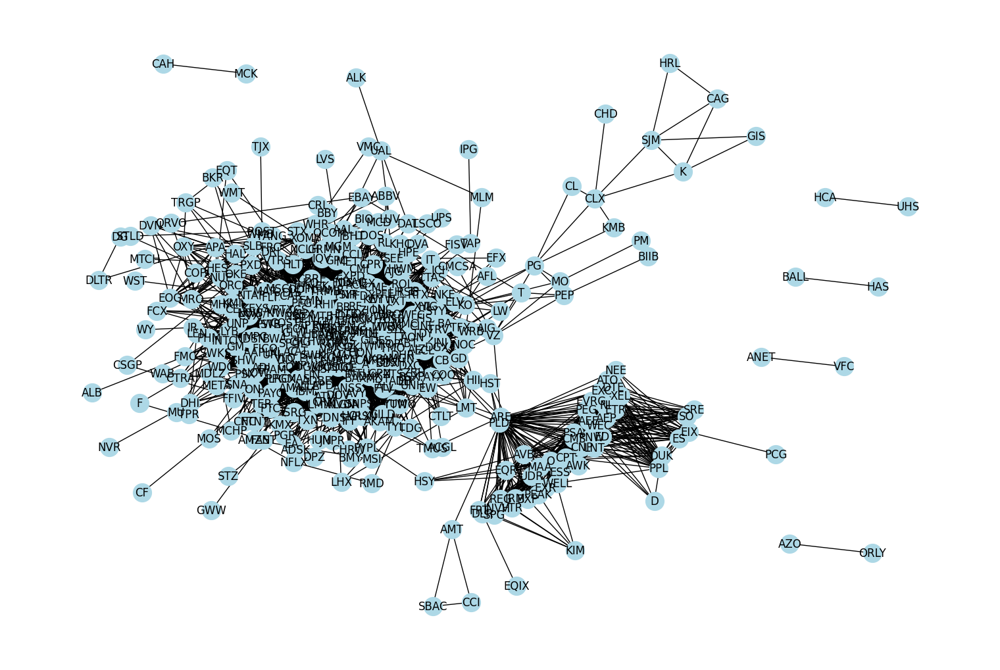

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


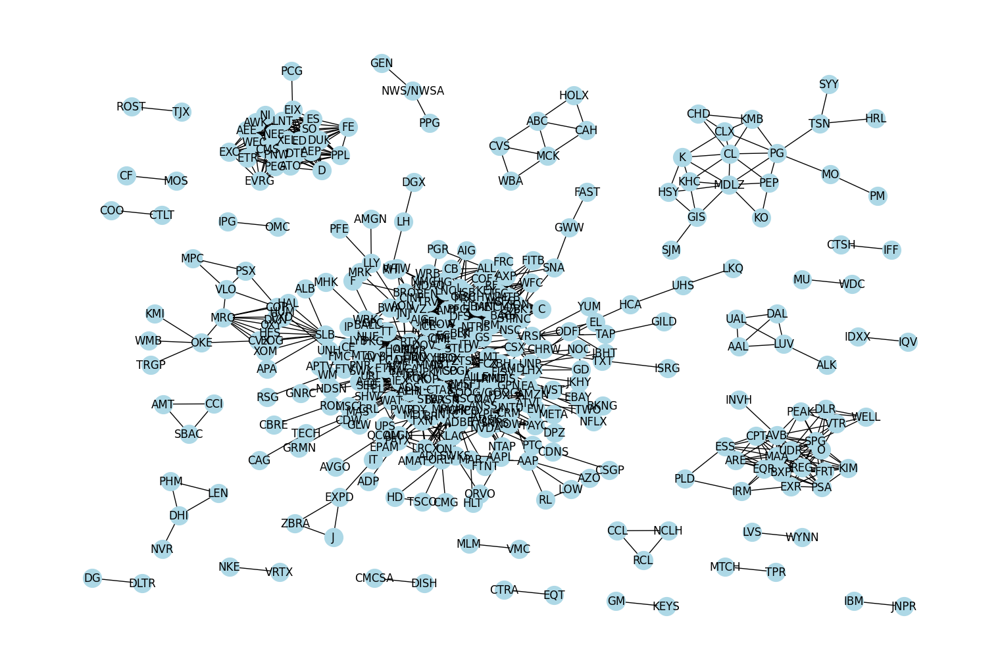

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


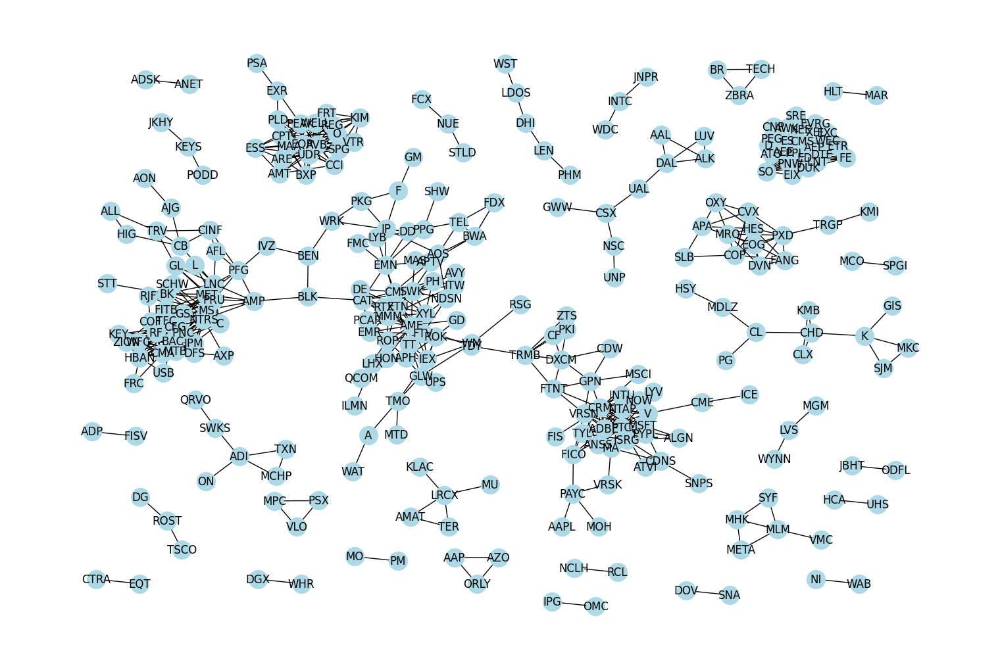

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


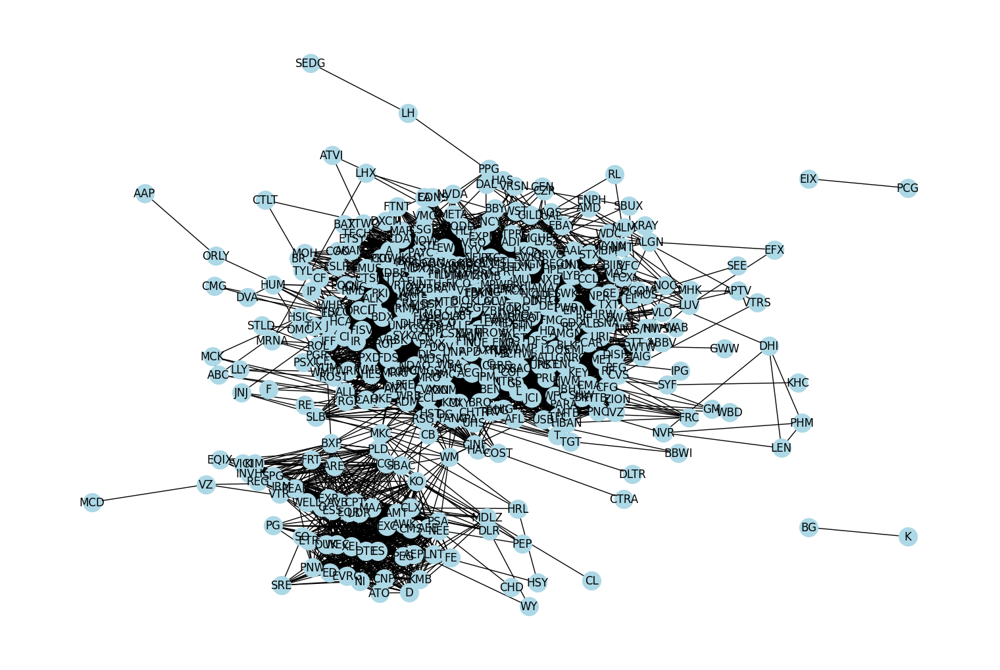

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


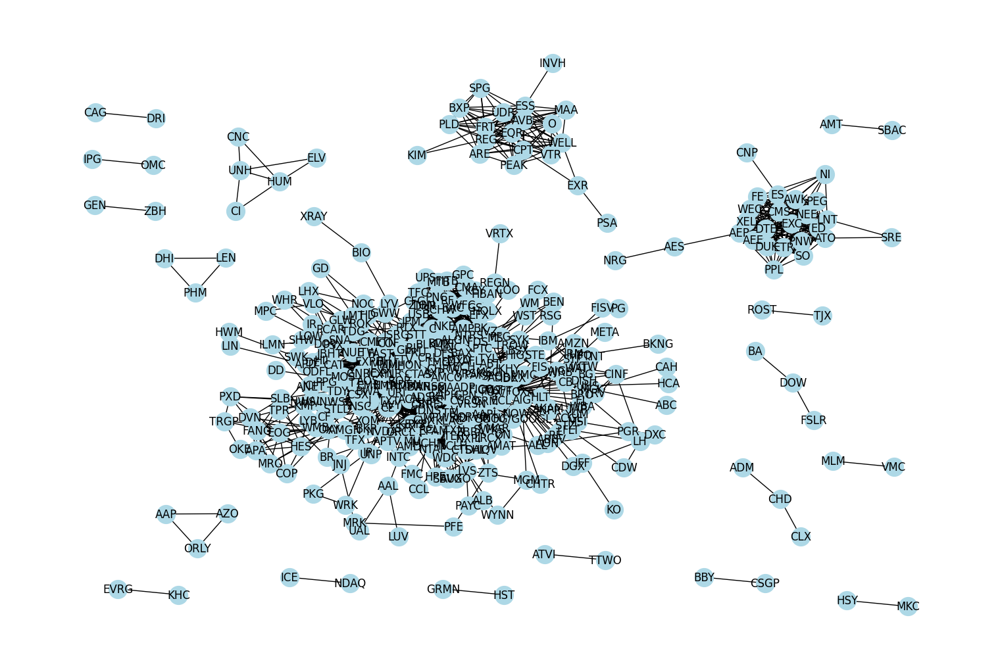

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


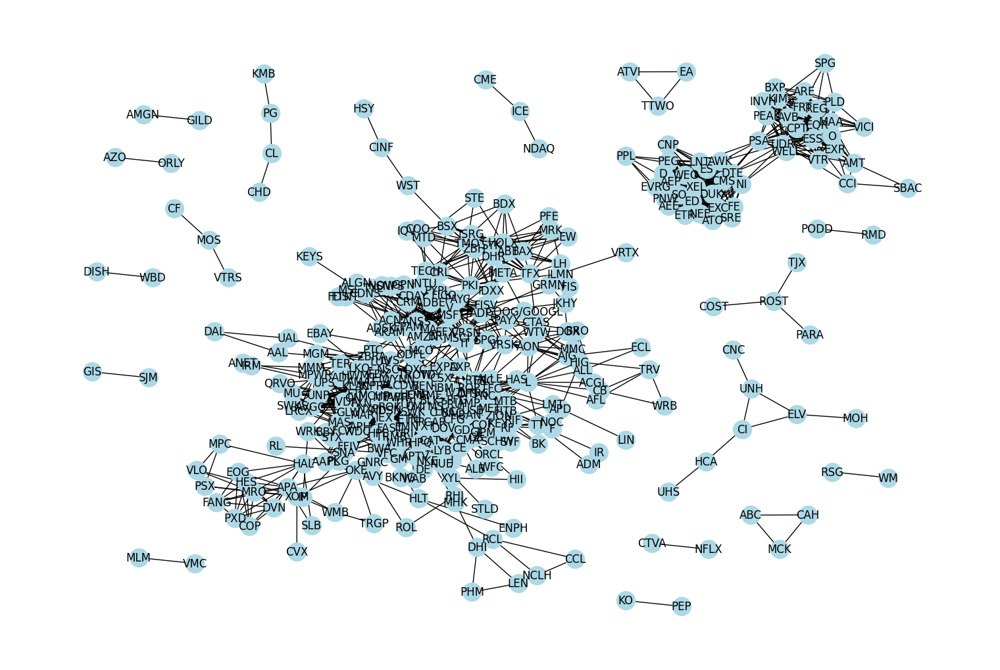

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


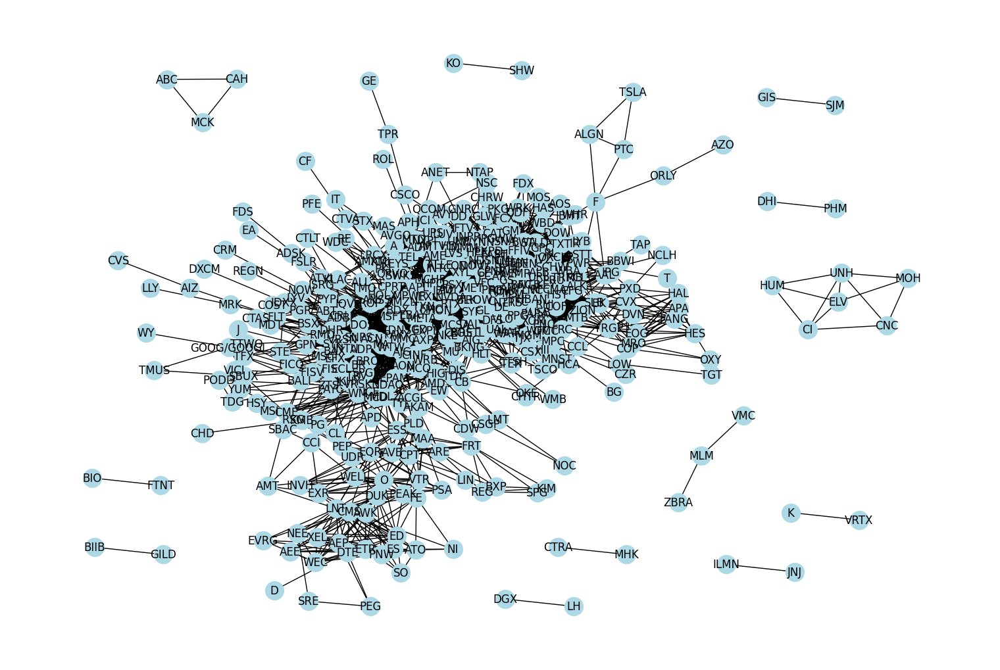

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


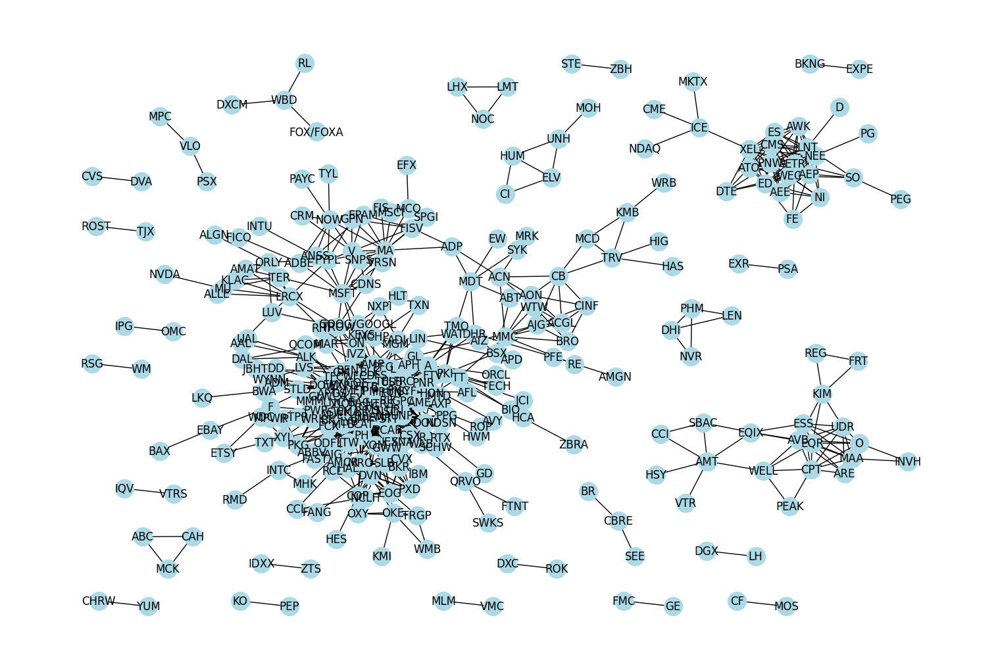

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


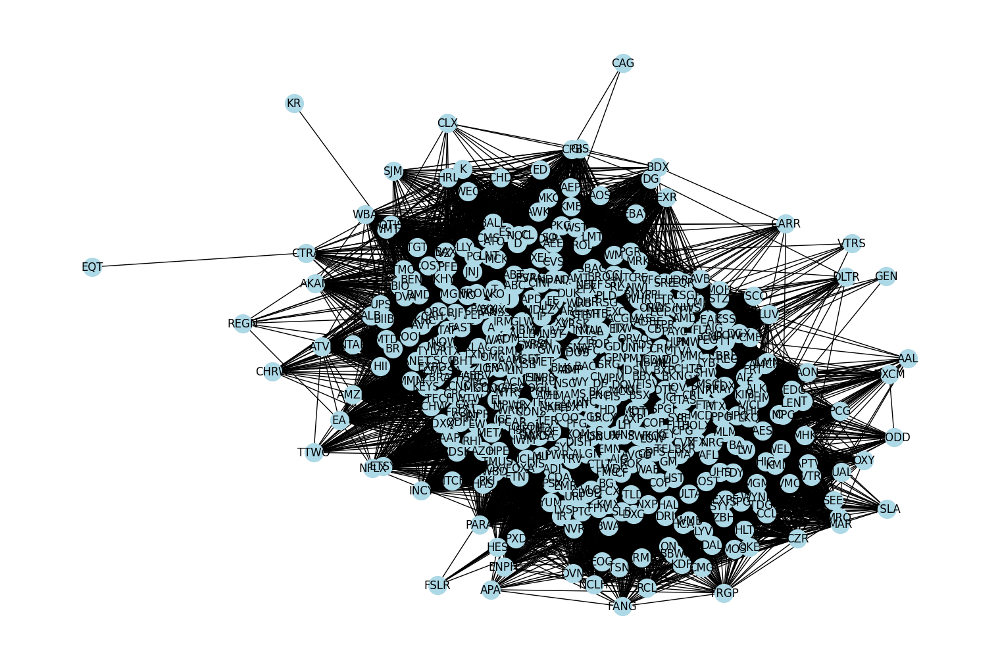

/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
/var/folders/j7/152m7hqd3pg_1qx71y_nsnk80000gn/T/ipykernel_37725/1230839189.py:47: DeprecationWarning: nx.nx_pydot.graphviz_layout depends on the pydot package, which hasknown issues and is not actively maintained. Consider usingnx.nx_agraph.graphviz_layout instead.

See https://github.com/networkx/networkx/issues/5723
  nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)


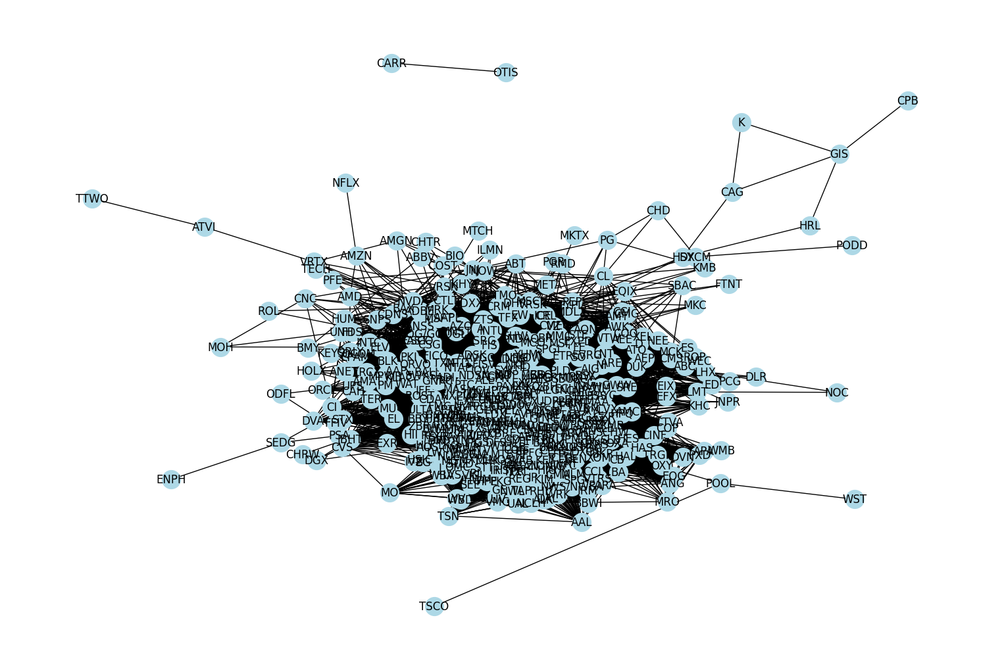

In [29]:
def create_network_graphs(num_csv):
    
    '''Creates network graphs using node/edge lists derived from the binary correlation matrix dataframes'''
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 15
    fig_size[1] = 10
        
    year_list, graph_list = [], [] 
    node_list, edge_list, comp_list, max_size, avg_size, clust_coeff = [], [], [], [], [], []
    
    # Read binary correlation matrix csv files into dataframes and append to a list
    for i in range(1, num_csv+1):
        year_list.append(pd.read_csv('Quarters_Adj_Matrices/Q'+str(i)+'_logret.csv'))
    print(len(year_list))
    
    # Create node/edge tables of each dataframe
    for j, year in enumerate(year_list):
        year.set_index('Unnamed: 0', inplace=True)
        year.index.name = None
        links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
        links = links.stack().reset_index()
        links.columns = ['stock1', 'stock2','value']
        links['value'] = links['value'].astype(int)
        links_filtered = links.loc[(links['value'] == 1)]
        
        
        # Draw network graphs and save to png files
        G = nx.from_pandas_edgelist(links_filtered, 'stock1', 'stock2')
        graph_list.append(G)

        node_list.append(len(G.nodes)) 
        edge_list.append(len(G.edges))
        
        # Separate network into disconnected components, compute average clustering coefficient
        subgraphs = list(nx.connected_components(G))
        comp_list.append(len(subgraphs))
        
        comp_size = []
        for graph in subgraphs:
            comp_size.append(len(graph))
            
        max_size.append(round(np.max(comp_size), 4))
        avg_size.append(round(np.mean(comp_size), 4))
        clust_coeff.append(round(nx.average_clustering(G),4))
        
        nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='lightblue', node_size=400, edge_color='black', linewidths=1, font_size=12)  
        plt.savefig('Images/Q'+str(j+1)+'_logret.png')
        plt.show()
        plt.close()
    
    # Create table showing no. of nodes, edges, components, max component size and avg component size for each year
    df_graph_stats = pd.DataFrame(node_list, columns=['num_connected_nodes'])
    df_graph_stats['num_edges'] = edge_list
    df_graph_stats['num_components'] = comp_list
    df_graph_stats['max_component_size'] = max_size
    df_graph_stats['avg_component_size'] = avg_size
    df_graph_stats['avg_clustering_coeff'] = clust_coeff
    df_graph_stats.index += 1
    df_graph_stats.index.name = 'Quarter' 
    
    return graph_list, df_graph_stats

# Implementation                    
graph_list, df_graph_stats = create_network_graphs(10)

In [ ]:
# Inspect dataframe
df_graph_stats